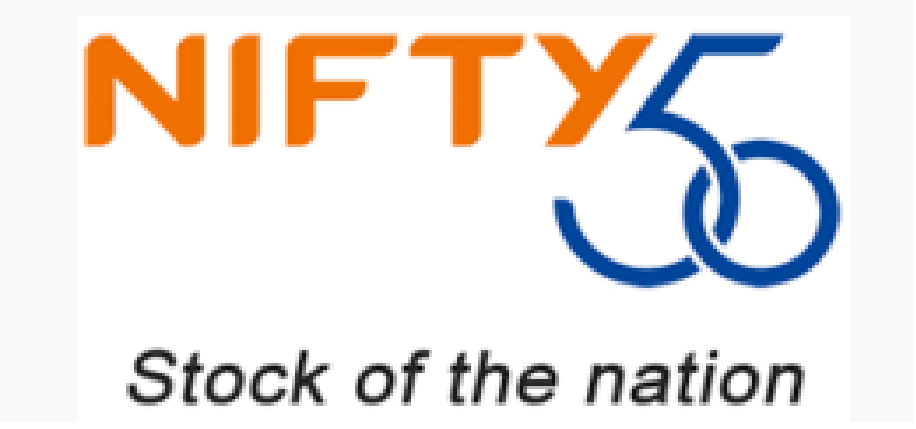

In [1]:
from IPython.display import Image
Image("../input/nifty51/9.PNG")

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from pandas_profiling import ProfileReport

data = pd.read_csv('../input/nifty-indices-dataset/NIFTY 50.csv')
data['Date'] = pd.to_datetime(data['Date'])
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day

# Report of Nifty 50 data

In [3]:
report = ProfileReport(data)
#report

In [4]:
report

# Nifty graph in the last 2 decades

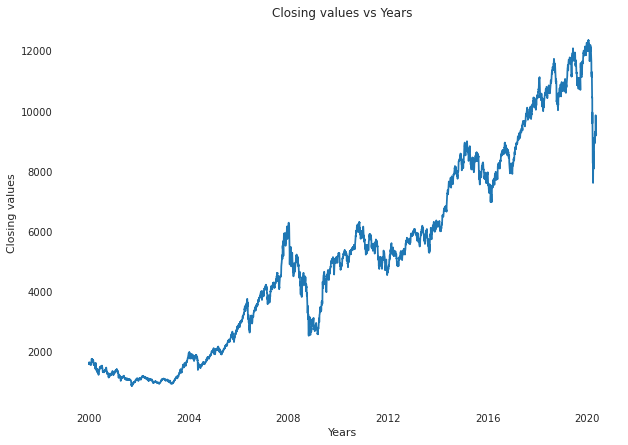

In [5]:
plt.figure(figsize=(10,7))
plt.plot(data['Date'],data['Close'])
plt.xlabel('Years')
plt.ylabel('Closing values')
plt.title('Closing values vs Years')
plt.show()

# What years had the highest 5 peaks? ---> 2015,2017,2018,2019,2020

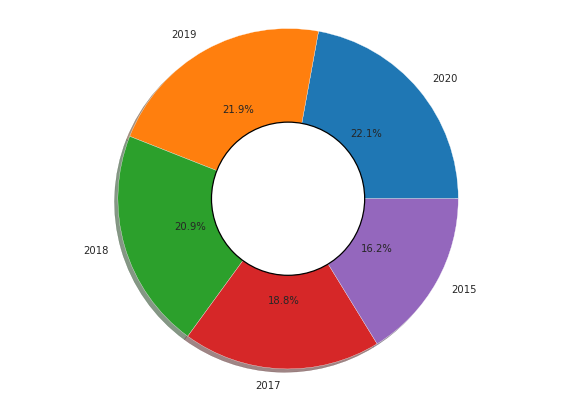

In [6]:
peaks = data.loc[:, ['year','High']]
peaks['max_high'] = peaks.groupby('year')['High'].transform('max')
peaks.drop('High', axis=1, inplace=True)
peaks = peaks.drop_duplicates()
peaks = peaks.sort_values('max_high', ascending=False)
peaks = peaks.head()

fig = plt.figure(figsize=(10,7))
plt.pie(peaks['max_high'], labels=peaks['year'], autopct='%1.1f%%', shadow=True)
centre_circle = plt.Circle((0,0),0.45,color='black', fc='white',linewidth=1.25)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.show()

## From the above donut plot it seems that the prices were low in the year 2016

# Distribution of the highest values

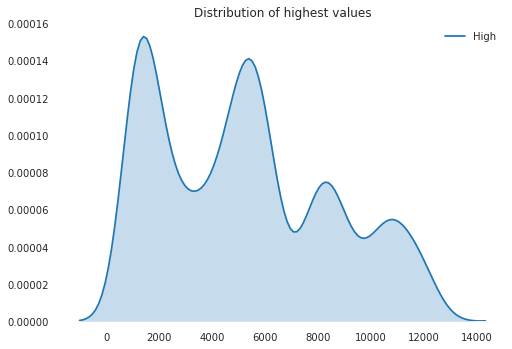

In [7]:
sns.kdeplot(data=data['High'], shade=True)
plt.title('Distribution of highest values')
plt.show()

# Distribution of transaction volume

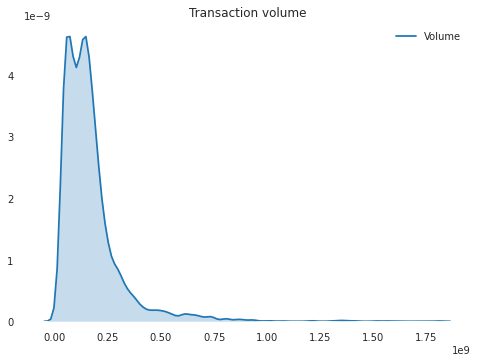

In [8]:
sns.kdeplot(data=data['Volume'], shade=True)
plt.title('Transaction volume')
plt.show()

# Volume of transactions per year

In [9]:
top_5_genres = [1,3,5,7,9,11]
perc = data.loc[:,["year","month",'Volume']]
perc['new_volume'] = perc.groupby([perc.month,perc.year])['Volume'].transform('mean')
perc.drop('Volume', axis=1, inplace=True)
perc = perc[perc.year<2020]
perc = perc.drop_duplicates()
perc = perc.loc[perc['month'].isin(top_5_genres)]
perc = perc.sort_values("year")

fig=px.bar(perc,x='month', y="new_volume", animation_frame="year", 
           animation_group="month", color="month", hover_name="month", range_y=[perc['new_volume'].min(), perc['new_volume'].max()])
fig.update_layout(showlegend=False)
fig.show()

# Relation of Volume to stock prices

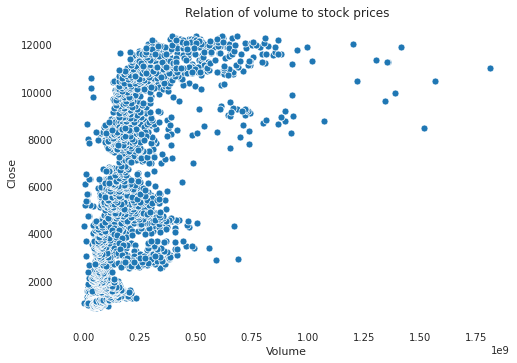

In [10]:
sns.scatterplot(data=data, x='Volume', y='Close')
plt.title('Relation of volume to stock prices')
plt.show()

# What is turnover?

Turnover is the net sales generated by a business, while profit is the residual earnings of a business after all expenses have been charged against net sales. Thus, turnover and profit are essentially the beginning and ending points of the income statement - the top-line revenues and the bottom-line results.

# Distribution of Turnover

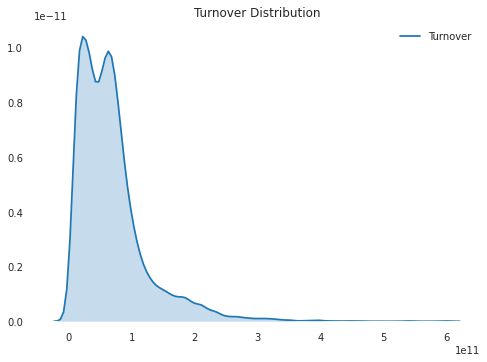

In [11]:
sns.kdeplot(data=data['Turnover'], shade=True)
plt.title('Turnover Distribution')
plt.show()

# Relation of turnover to Volume

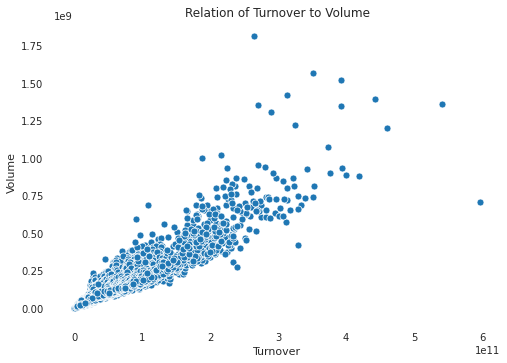

In [12]:
sns.scatterplot(data=data, x='Turnover', y='Volume')
plt.title('Relation of Turnover to Volume')
plt.show()

# Monthly Turnover per year

In [13]:
turn = data.loc[:,['year','month','Turnover']]
turn['monthly_turnover'] = turn.groupby([turn.year,turn.month])['Turnover'].transform('mean')
turn.drop('Turnover', axis=1, inplace=True)
turn = turn.drop_duplicates()
fig = px.scatter(turn, x="month", y="monthly_turnover", animation_frame="year", animation_group="month", color="month", hover_name="month", size_max=1000 \
                , range_y=[turn['monthly_turnover'].min(), turn['monthly_turnover'].max()])
fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()